Repo card metadata block was not found. Setting CardData to empty.


Resolving data files:   0%|          | 0/200 [00:00<?, ?it/s]

✅ Dataset loaded successfully!
Columns: ['image']
Number of images: 200

Example row:
{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4000x5000 at 0x7E0877B0D2E0>}
🚀 Generating and comparing captions...
✅ Processed 1/200 images
✅ Processed 11/200 images
✅ Processed 21/200 images
✅ Processed 31/200 images
✅ Processed 41/200 images
✅ Processed 51/200 images
✅ Processed 61/200 images
✅ Processed 71/200 images
✅ Processed 81/200 images
✅ Processed 91/200 images
✅ Processed 101/200 images
✅ Processed 111/200 images
✅ Processed 121/200 images
✅ Processed 131/200 images
✅ Processed 141/200 images
✅ Processed 151/200 images
✅ Processed 161/200 images
✅ Processed 171/200 images
✅ Processed 181/200 images
✅ Processed 191/200 images

✅ Generated captions for 200 images out of 200.
❌ Failed images: 0
📁 Saved results:
 - Captions: image_caption_comparison_full.csv

🖼️ Displaying images with Original + Generated captions in grids...



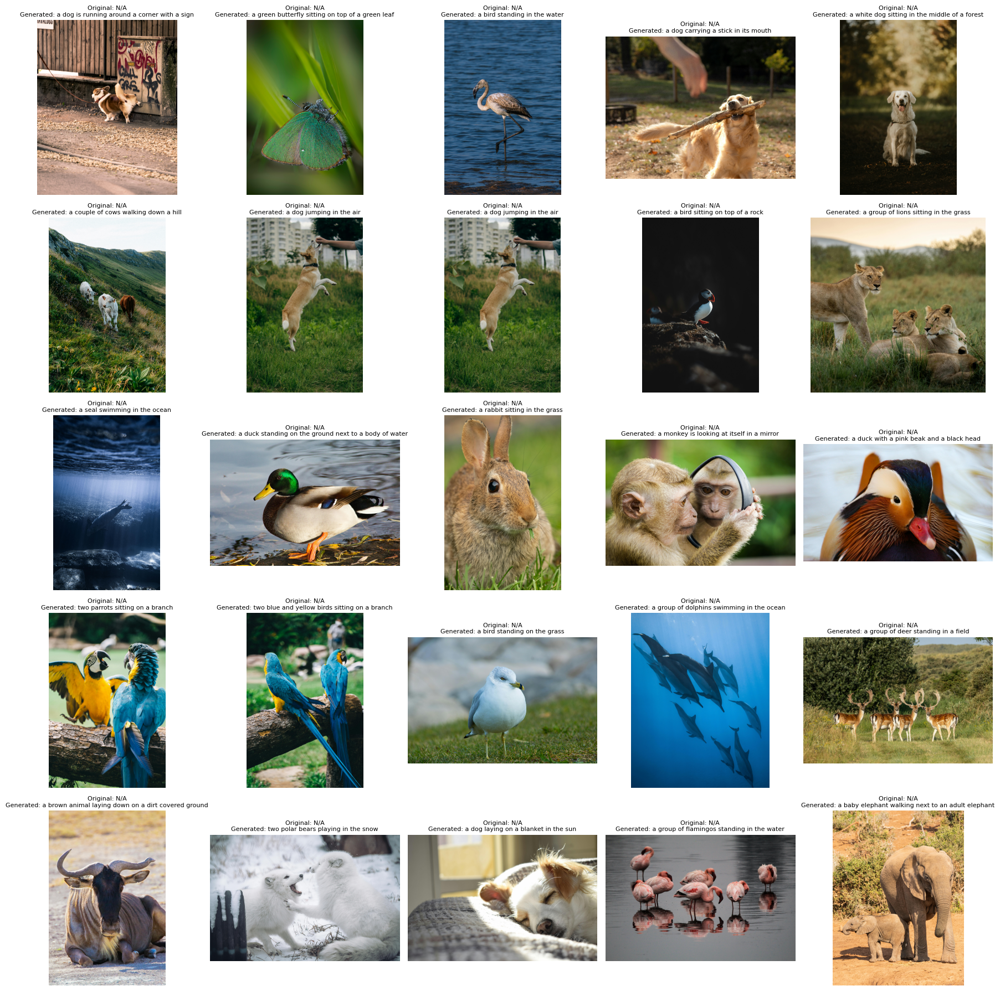

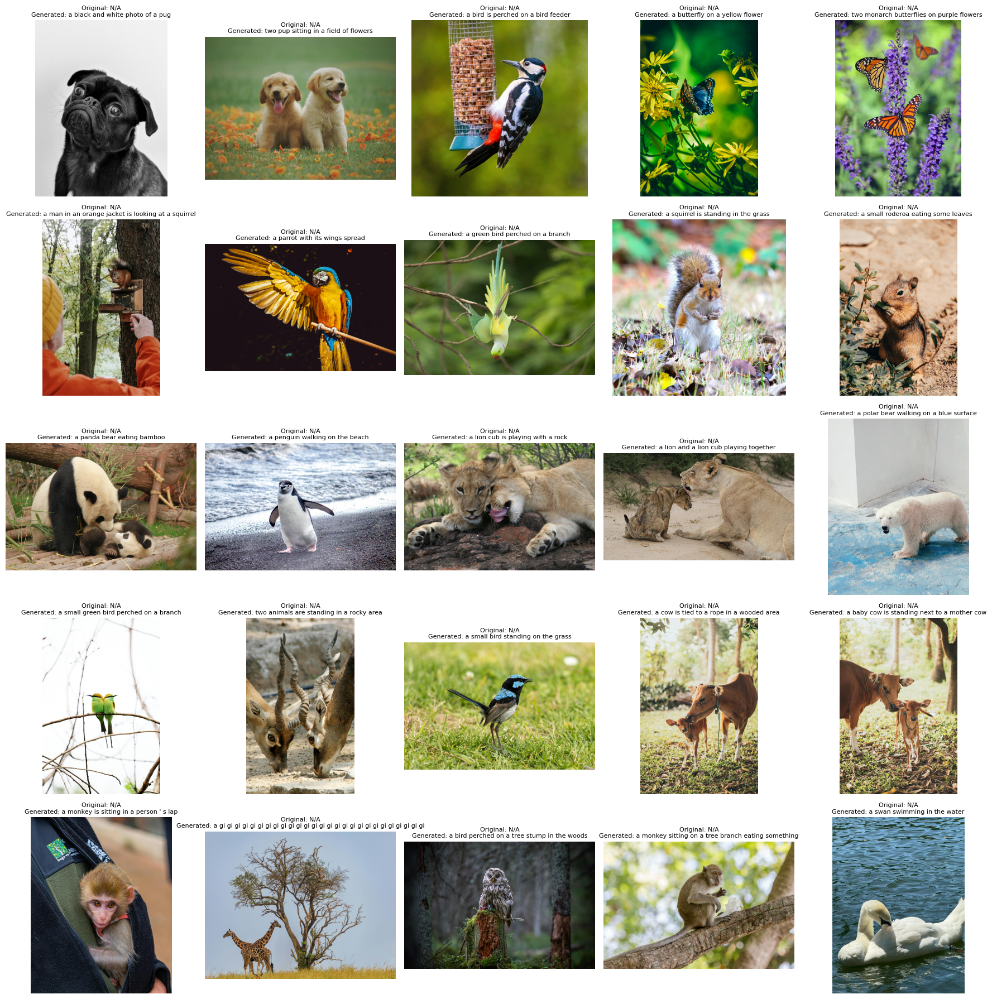

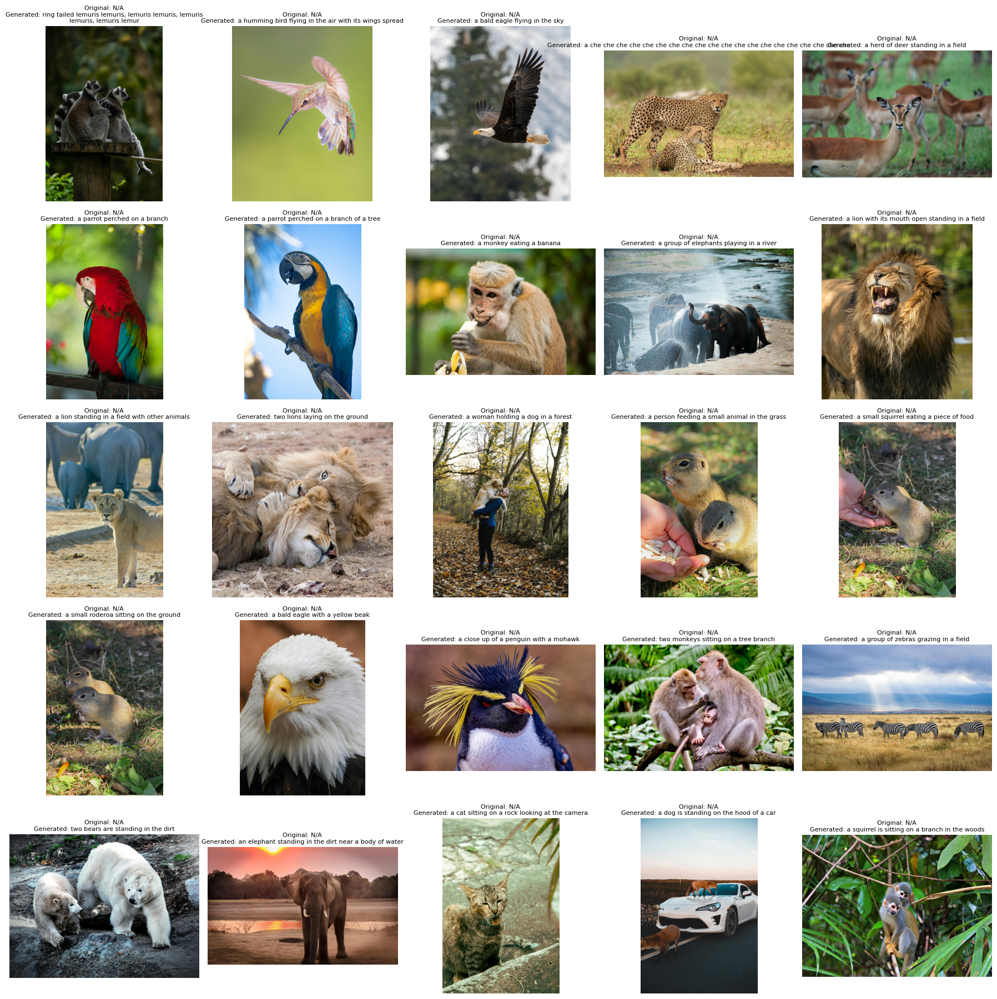

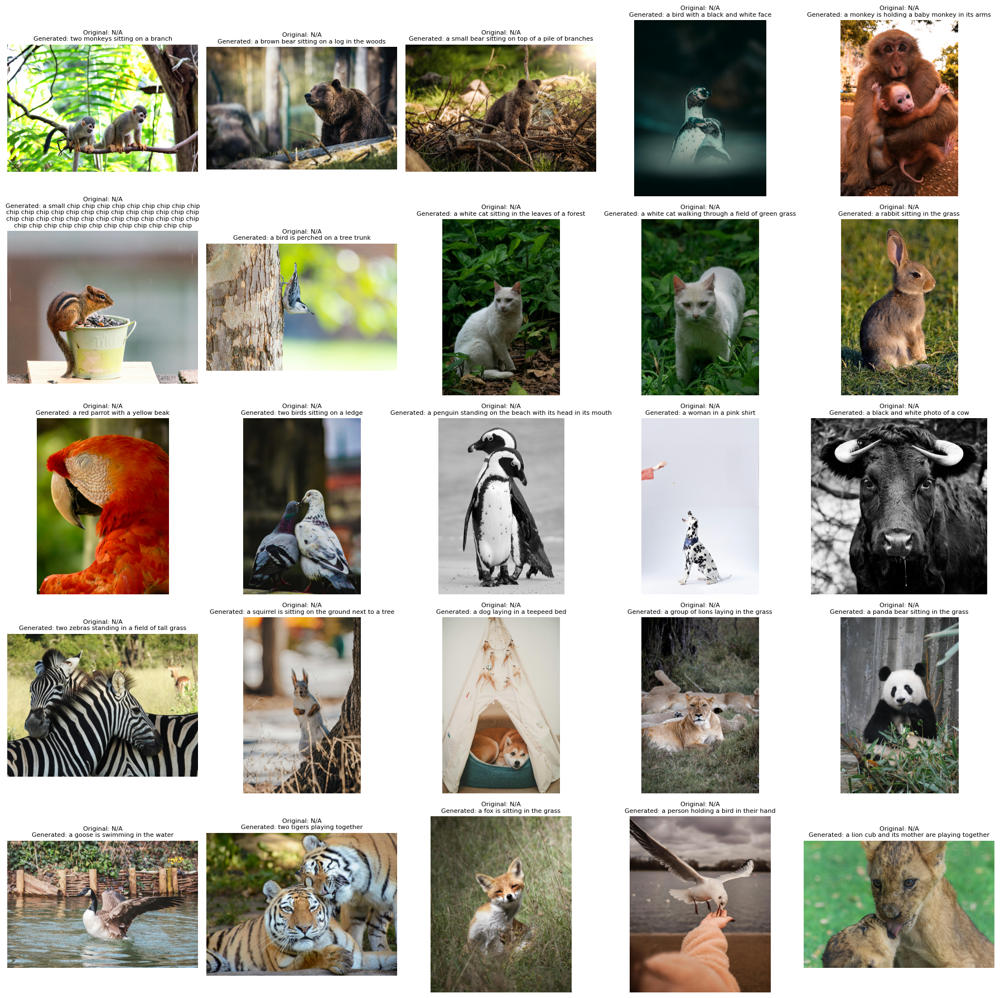

In [ ]:
# =========================================
# IMAGE CAPTION COMPARISON USING BLIP (Full Pipeline)
# Dataset: MANASWINREDDY/Image_to_caption
# =========================================

!pip install transformers datasets torch torchvision pillow matplotlib accelerate --quiet

# -----------------------------
# Step 1: Imports
# -----------------------------
from transformers import BlipProcessor, BlipForConditionalGeneration
from datasets import load_dataset
from PIL import Image
import matplotlib.pyplot as plt
import requests
from io import BytesIO
import os
import torch
import pandas as pd
import time

# -----------------------------
# Step 2: Load Dataset
# -----------------------------
dataset_name = "MANASWINREDDY/Image_to_caption"
dataset = load_dataset(dataset_name, split="train")

print("✅ Dataset loaded successfully!")
print("Columns:", dataset.column_names)
print("Number of images:", len(dataset))
print("\nExample row:")
print(dataset[0])

# -----------------------------
# Step 3: Load BLIP Model
# -----------------------------
model_name = "Salesforce/blip-image-captioning-base"
processor = BlipProcessor.from_pretrained(model_name)
model = BlipForConditionalGeneration.from_pretrained(model_name).to("cuda" if torch.cuda.is_available() else "cpu")

# -----------------------------
# Step 4: Helper Functions
# -----------------------------
def load_image(img_data, retries=3, delay=2):
    """Load image from URL or file path with retries."""
    for attempt in range(retries):
        try:
            if isinstance(img_data, str):
                if os.path.exists(img_data):
                    image = Image.open(img_data).convert("RGB")
                else:
                    response = requests.get(img_data, timeout=15)
                    response.raise_for_status()
                    image = Image.open(BytesIO(response.content)).convert("RGB")
            elif isinstance(img_data, Image.Image):
                image = img_data.convert("RGB")
            else:
                return None
            return image
        except Exception as e:
            print(f"⚠️ Retry {attempt+1}/{retries} failed: {e}")
            time.sleep(delay)
    return None

def generate_caption(image):
    """Generate caption using BLIP."""
    try:
        inputs = processor(images=image, return_tensors="pt").to(model.device)
        gen_ids = model.generate(**inputs, max_length=50)
        caption = processor.decode(gen_ids[0], skip_special_tokens=True)
        return caption
    except Exception as e:
        print(f"⚠️ Caption generation failed: {e}")
        return "Error generating caption"

# -----------------------------
# Step 5: Generate and Compare Captions
# -----------------------------
results = []
failed_images = []
print("🚀 Generating and comparing captions...")

for i, item in enumerate(dataset):
    img_data = item.get("IMAGE_PATH") or item.get("image")
    original_caption = item.get("CAPTION", "N/A")

    image = load_image(img_data)
    if image is None:
        print(f"❌ Skipping image {i} (unreadable path or invalid URL).")
        failed_images.append({"index": i, "image_path": img_data, "error": "Failed to load image"})
        continue

    generated_caption = generate_caption(image)
    results.append({
        "index": i,
        "original_caption": original_caption,
        "generated_caption": generated_caption
    })

    if i % 10 == 0:
        print(f"✅ Processed {i+1}/{len(dataset)} images")

# -----------------------------
# Step 6: Save Results
# -----------------------------
df = pd.DataFrame(results)
df.to_csv("image_caption_comparison_full.csv", index=False)

if failed_images:
    pd.DataFrame(failed_images).to_csv("failed_images.csv", index=False)

print(f"\n✅ Generated captions for {len(results)} images out of {len(dataset)}.")
print(f"❌ Failed images: {len(failed_images)}")
print("📁 Saved results:")
print(" - Captions: image_caption_comparison_full.csv")
if failed_images:
    print(" - Failed logs: failed_images.csv")

# -----------------------------
# Step 7: Display Images in Grids with Original + Generated Captions
# -----------------------------
import math

def show_grid(images, original_captions, generated_captions, rows=5, cols=5):
    fig, axes = plt.subplots(rows, cols, figsize=(18, 18))
    for ax, img, orig, gen in zip(axes.flat, images, original_captions, generated_captions):
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"Original: {orig}\nGenerated: {gen}", fontsize=8, wrap=True)
    plt.tight_layout()
    plt.show()

batch_size = 25  # Number of images per grid
total_images = len(results)

print("\n🖼️ Displaying images with Original + Generated captions in grids...\n")

for start in range(0, total_images, batch_size):
    end = min(start + batch_size, total_images)
    images = []
    original_captions = []
    generated_captions = []

    for i in range(start, end):
        img_data = dataset[i].get("IMAGE_PATH") or dataset[i].get("image")
        image = load_image(img_data)
        if image:
            images.append(image)
            original_captions.append(results[i]['original_caption'])
            generated_captions.append(results[i]['generated_caption'])

    if images:
        show_grid(images, original_captions, generated_captions)
